# Business Objective 

Rampant fraud in US healthcare system results in increased premiums for many vulnerable citizens who cannot afford to pay hefty price for a fundamental right such as healthcare. The aim is to find patterns of fraud commited by providers and train ML models to detect similar patterns in the future. Dataset for this capstone project is obtained from Kaggle [here](https://www.kaggle.com/code/rohitrox/medical-provider-fraud-detection/data). 

Abuse in healthcare system can take many forms, such as: 
1. Billing for services that were not rendered. 
2. Duplicate submission of a claim for the same service. 
3. Charging for a more complex or expensive than was actually provided. 



# Data Overview

In [1]:
import pandas as pd
import os 

filepath = '/Users/monika.sharma1providence.org/Projects/MLE-course-10/assignment_1/MLE-10/assignments/capstone-project/EDA/data'

train_df = pd.read_csv(os.path.join(filepath, 'Train-1542865627584.csv'))
train_beneficiary_df = pd.read_csv(os.path.join(filepath, 'Train_Beneficiarydata-1542865627584.csv'))
train_inpatient_df = pd.read_csv(os.path.join(filepath, 'Train_Inpatientdata-1542865627584.csv'))
train_outpatient_df = pd.read_csv(os.path.join(filepath, 'Train_Outpatientdata-1542865627584.csv'))

In [29]:
!pip install sweetviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 15.1 MB 5.2 MB/s 


                                             |          | [  0%]   00:00 -> (? left)


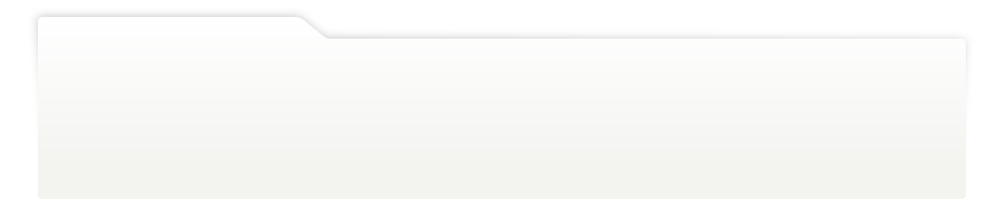
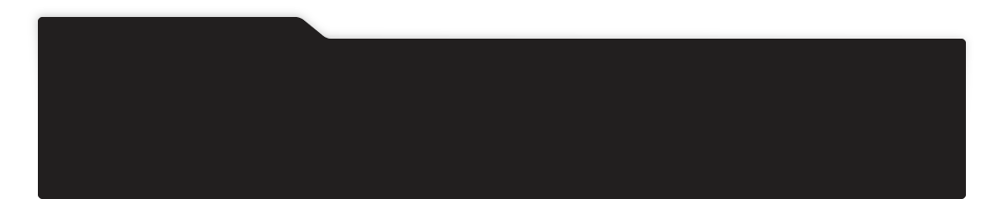
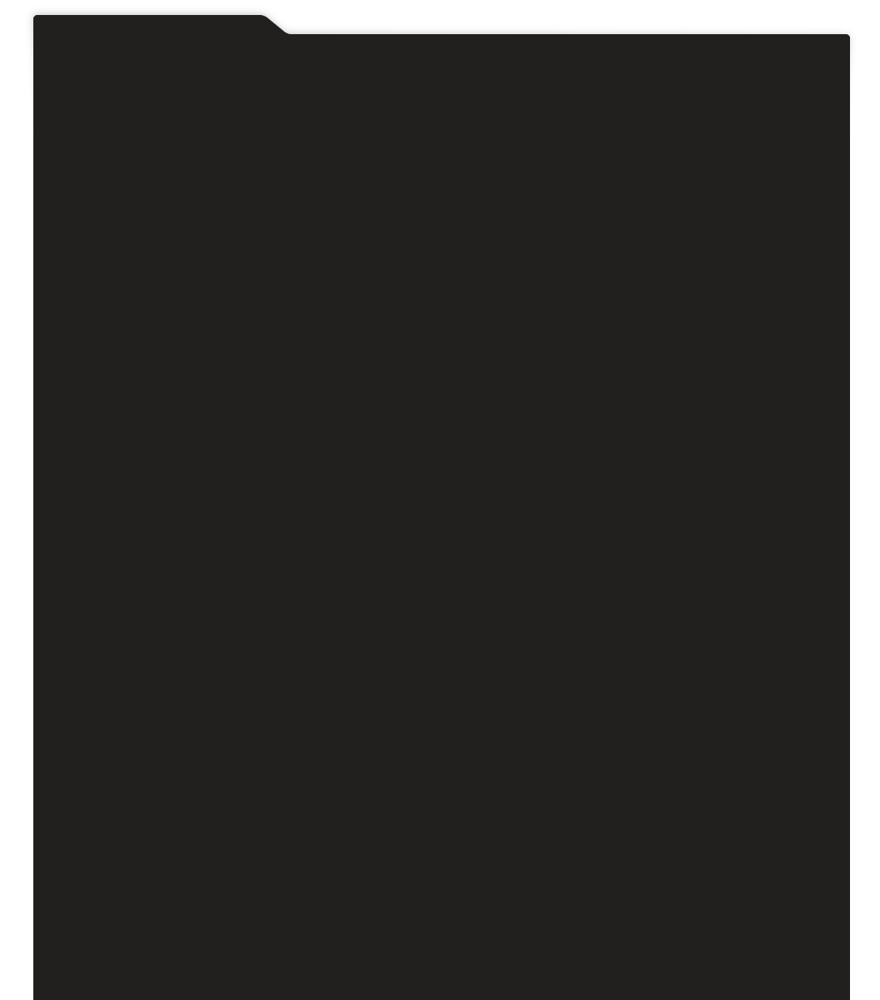
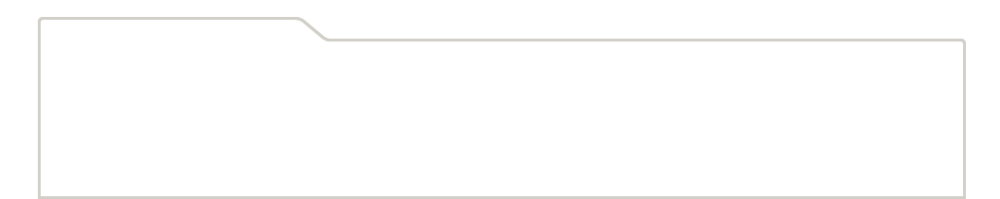
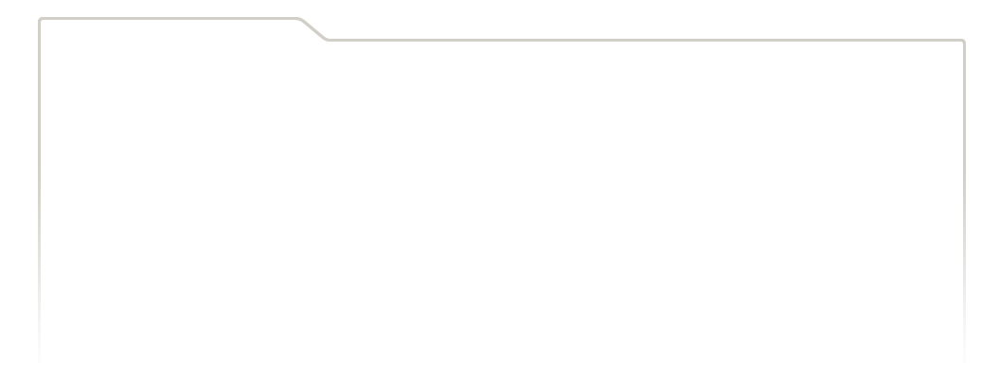
...
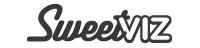
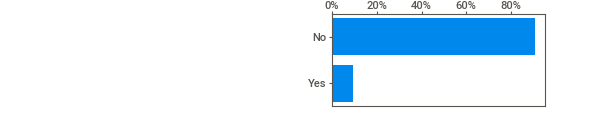
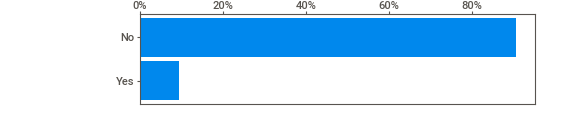
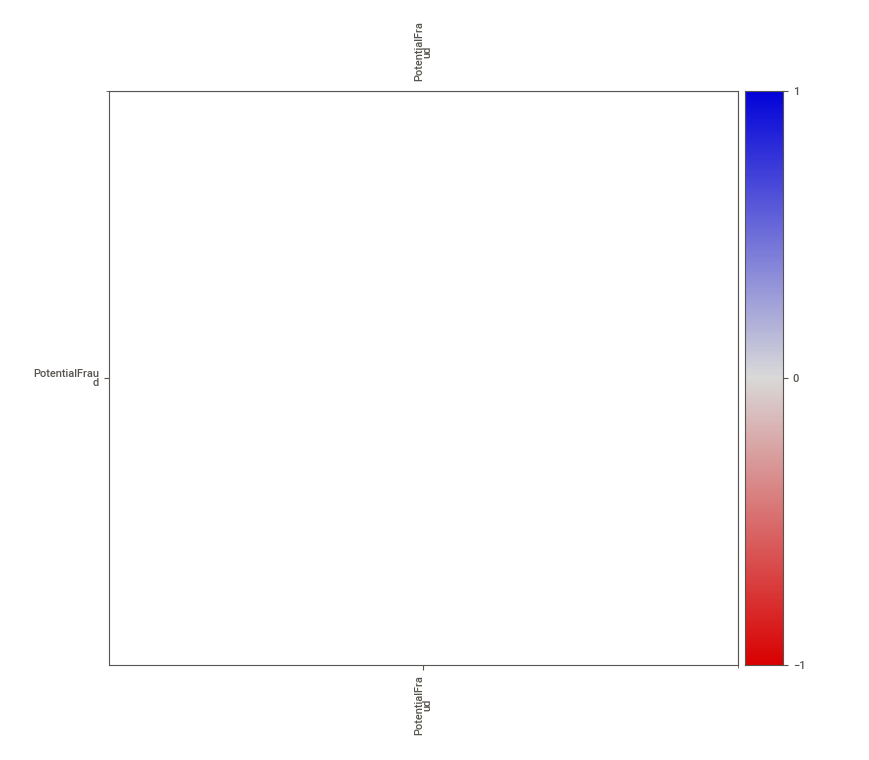
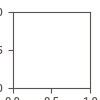

In [2]:
import sweetviz as sv

train_report = sv.analyze(train_df)
train_report.show_notebook()

In [3]:
train_df['PotentialFraud'].value_counts()

No     4904
Yes     506
Name: PotentialFraud, dtype: int64

## Fraud labels
* This dataset contains fraud labels for providers who have/have not commited fraud. 
* This is an imbalanced dataset with ~10% records with Potential Fraud = 'yes' and the rest are 'no' 
* Class imbalance needs to be taken into account here 

In [4]:
train_beneficiary_report = sv.analyze(train_beneficiary_df)

                                             |          | [  0%]   00:00 -> (? left)


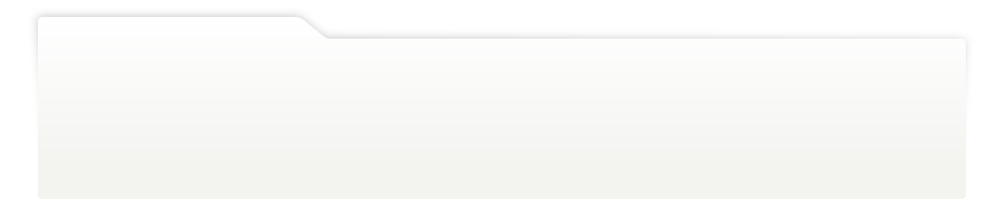
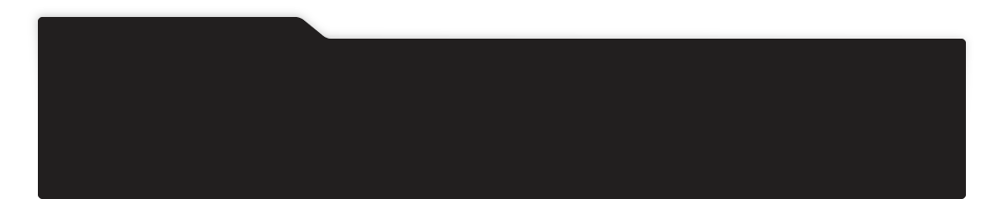
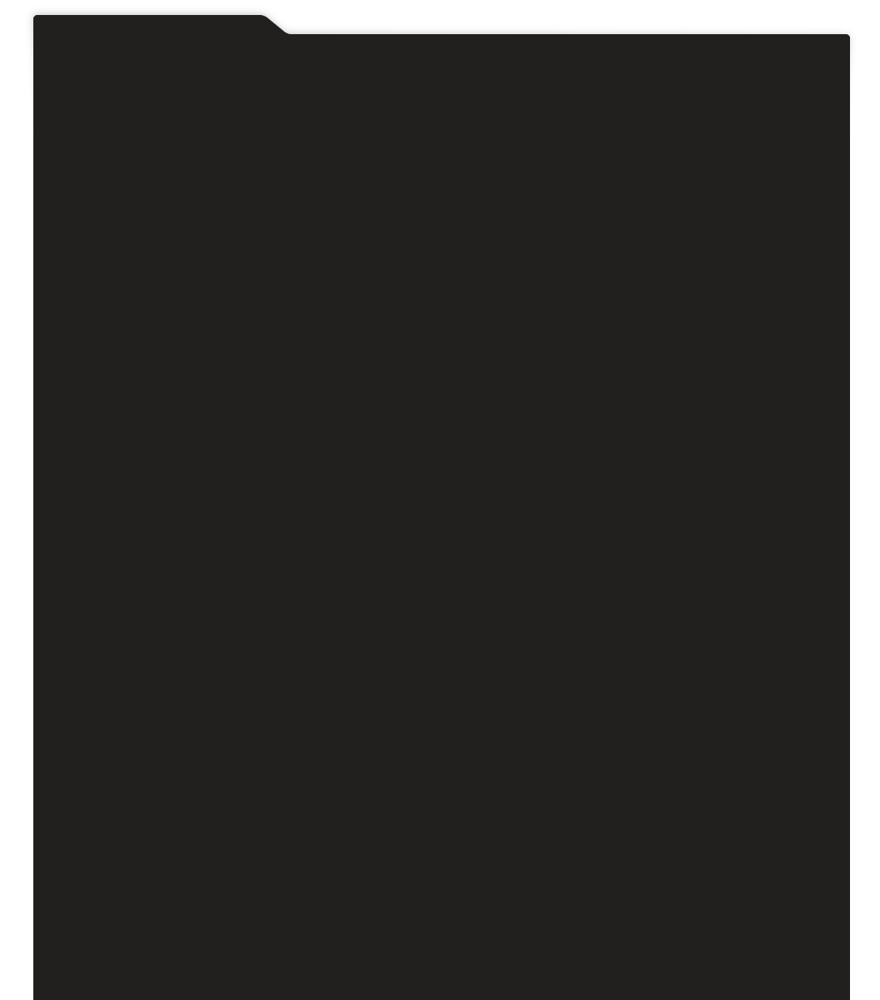
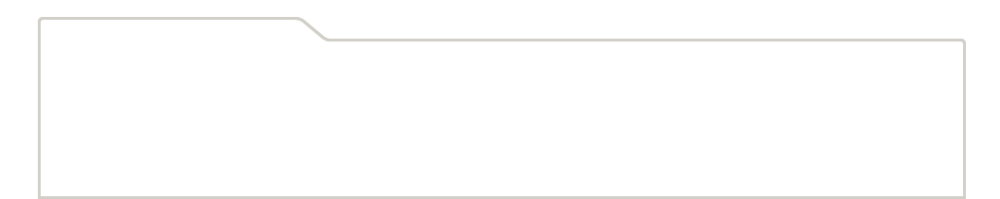
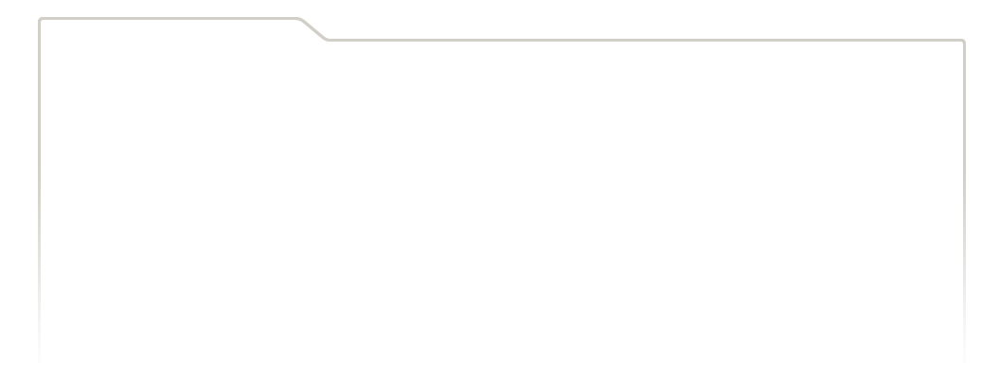
...
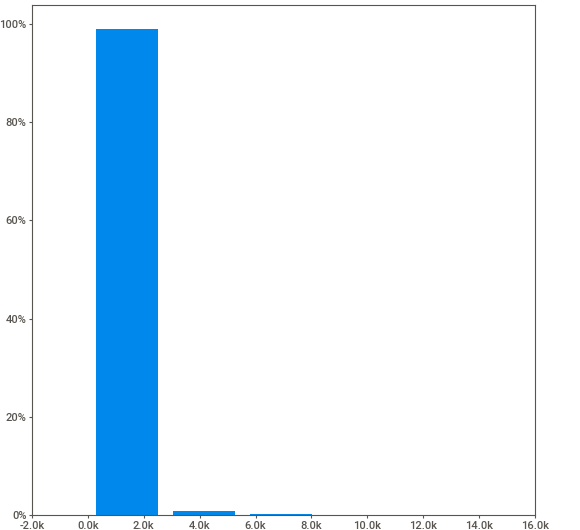
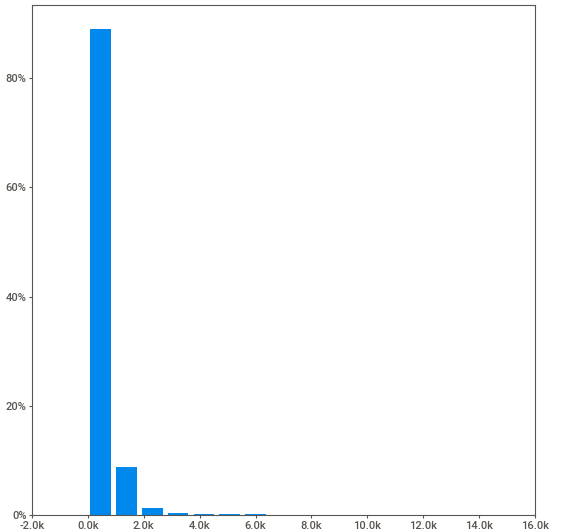
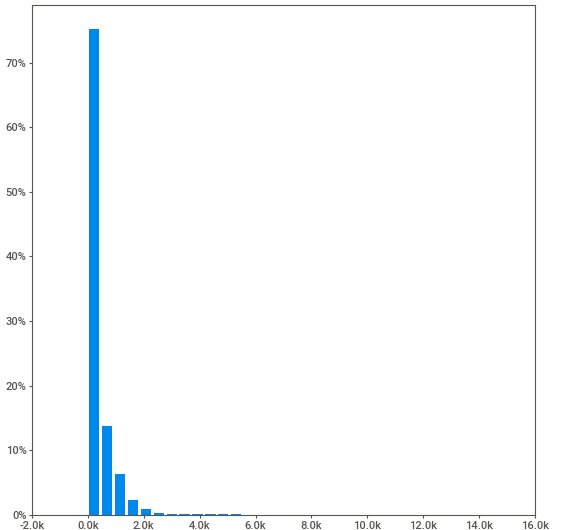
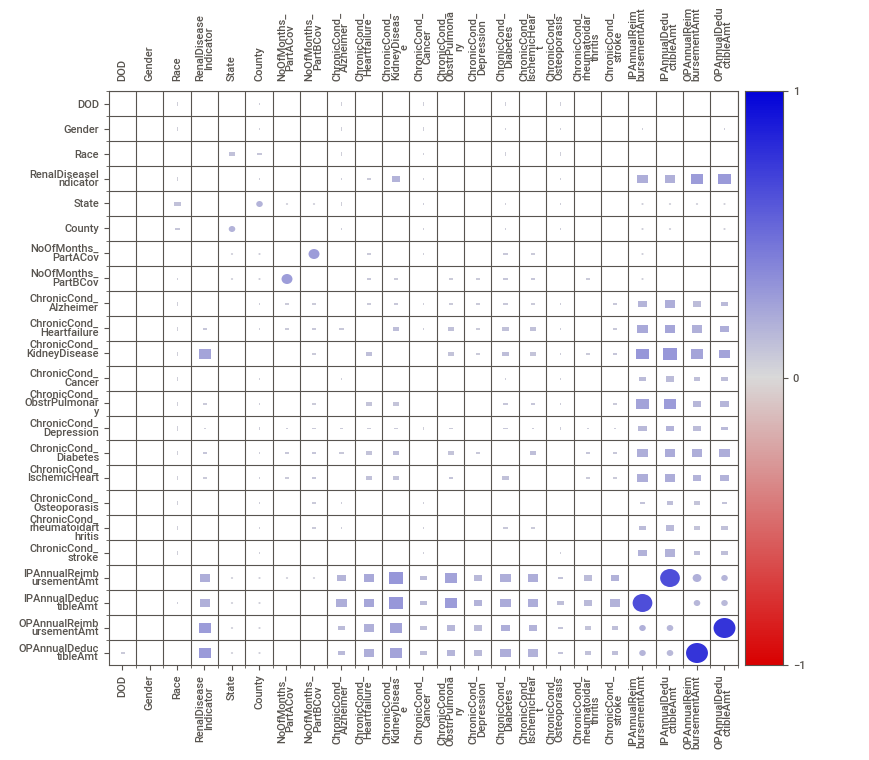
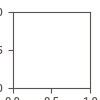

In [5]:
train_beneficiary_report.show_notebook()

## Beneficiary Data Summary 

* There are 138,556 beneficiaries, populated over the entire United States, and many counties 
* We have their DOB, gender, race, and disease related information available. 
* Disesases such as Alzheimer, heart failure, kidney disease, cancer, pulmonary, depression, diabetes, Osteoporasis, rheumatoidarthritis, stroke condition etc. 
* Besides this, we also have insurance related information such as deductible amount, In-patient and Out-patient annual reimbursement amount etc. 

                                             |          | [  0%]   00:00 -> (? left)


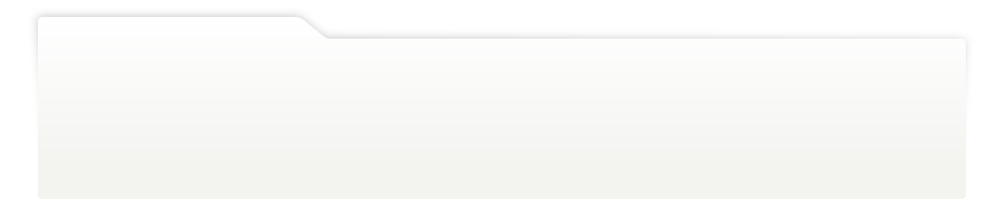
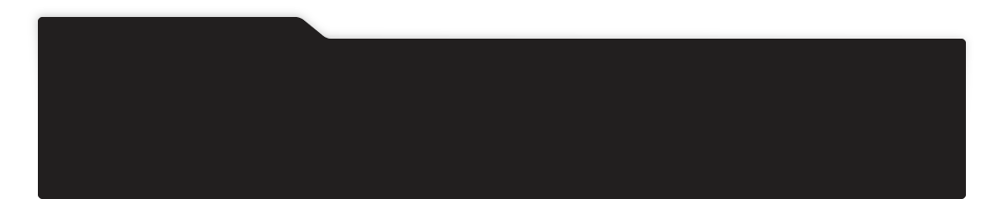
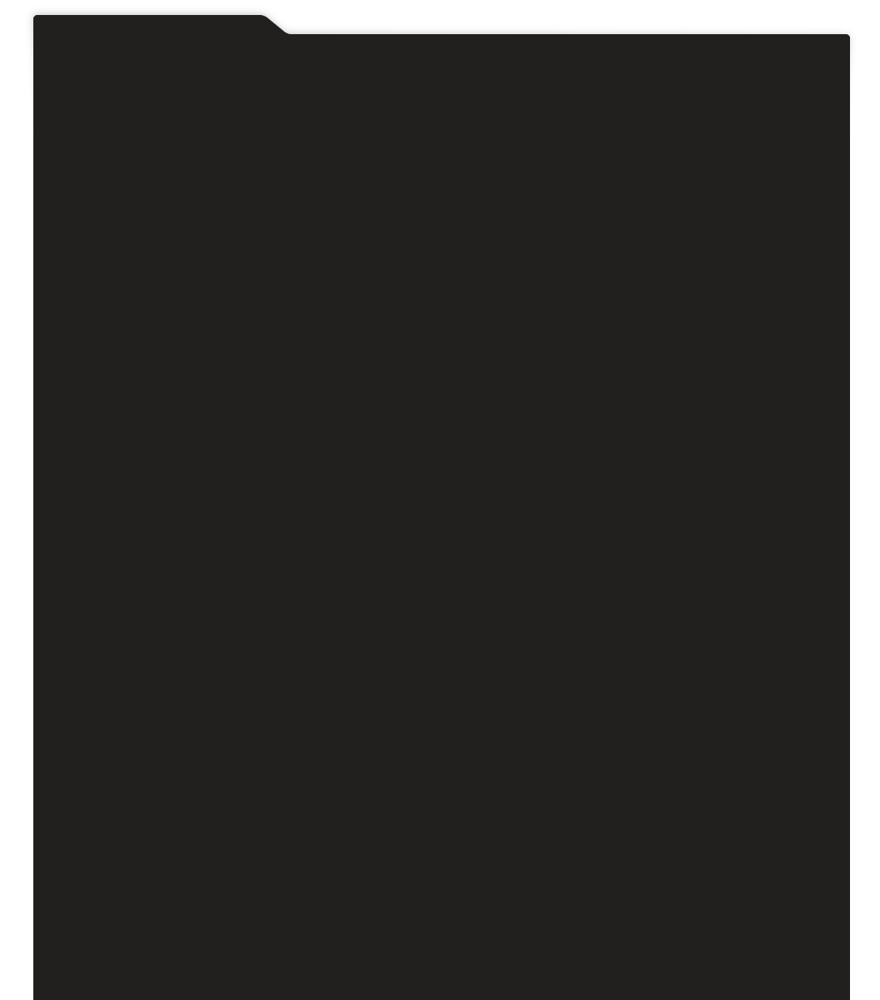
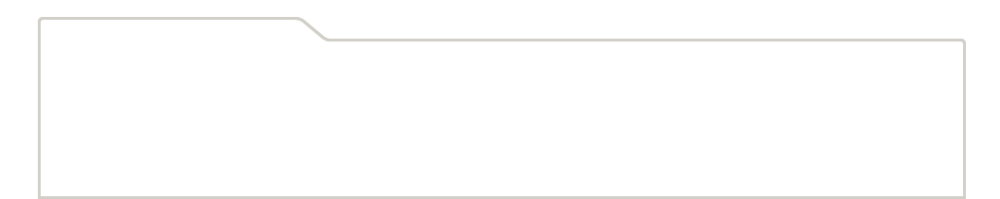
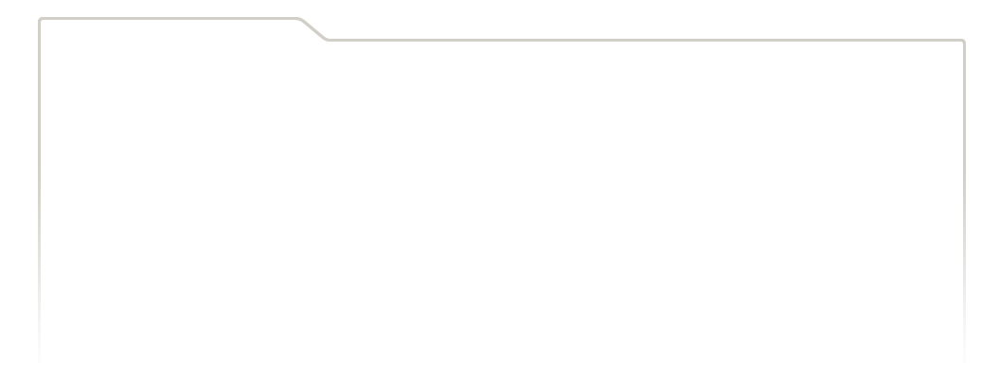
...
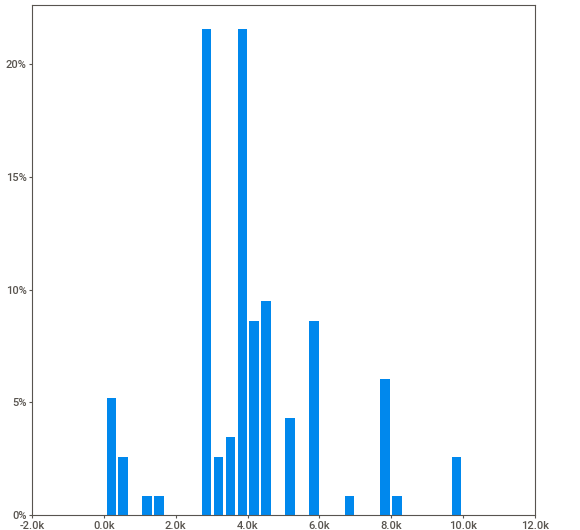
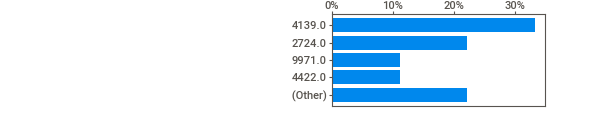
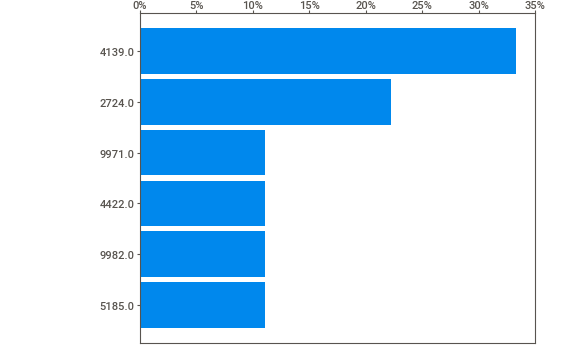
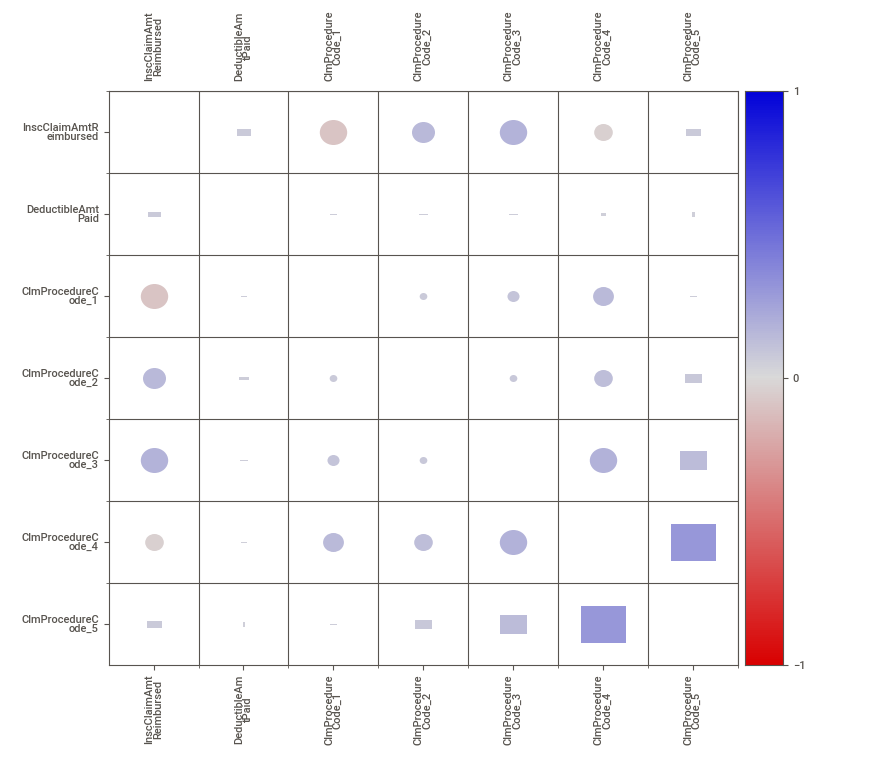
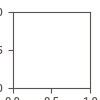

In [6]:
train_inpatient_report = sv.analyze(train_inpatient_df)
train_inpatient_report.show_notebook()

## In-Patient Data Summary

* This dataset has 40,474 records. And it contains information such as Beneficiary ID, Claim ID, start and end day of the claim. 
* Provider that rendered various services. 
* Amount reimbursed by the insurance company.
* Most importantly, it contains Diagnosis code, multiple claim diagnosis code, multiple claim procedure code etc.

                                             |          | [  0%]   00:00 -> (? left)


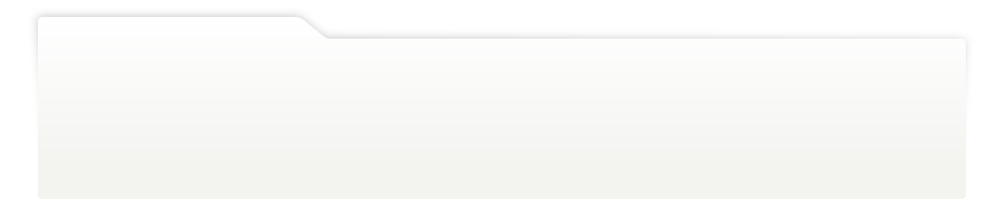
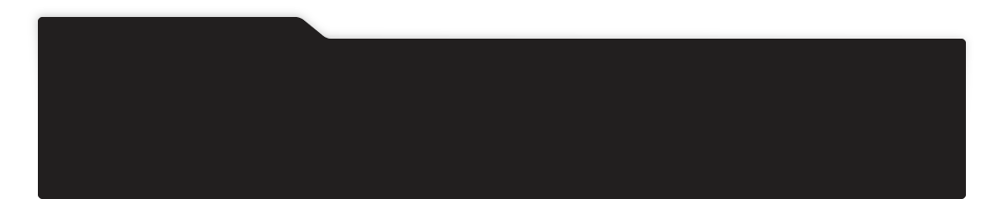
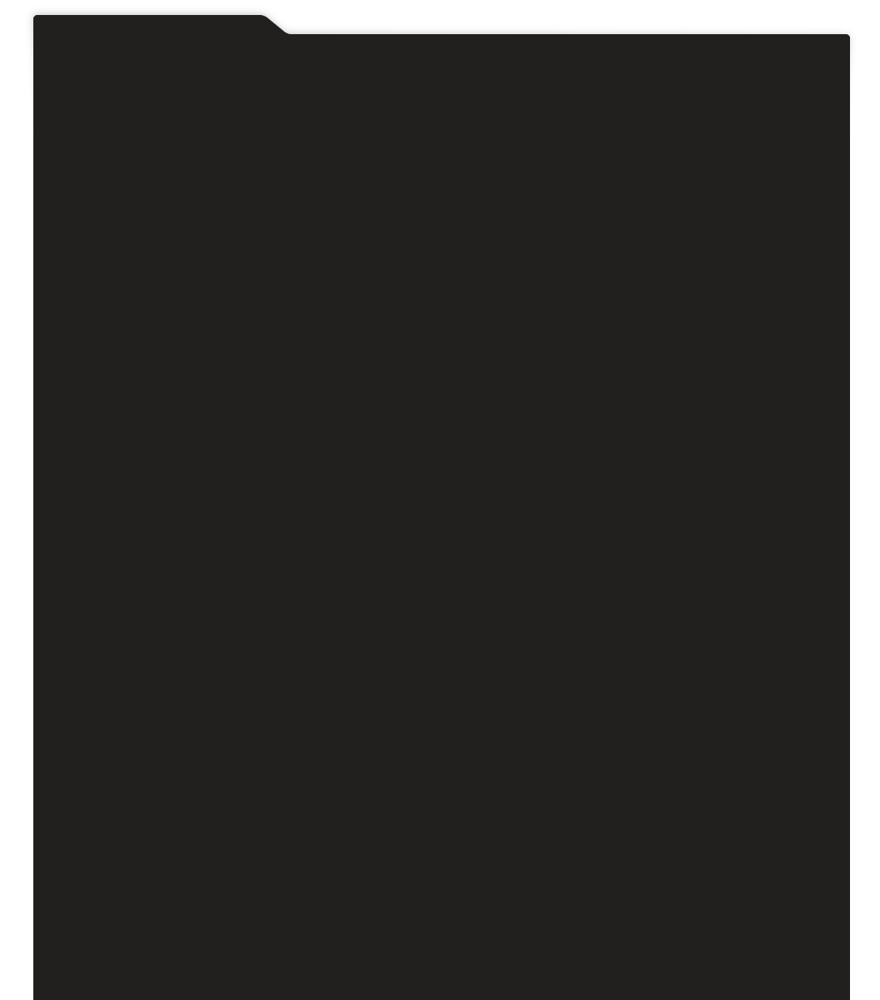
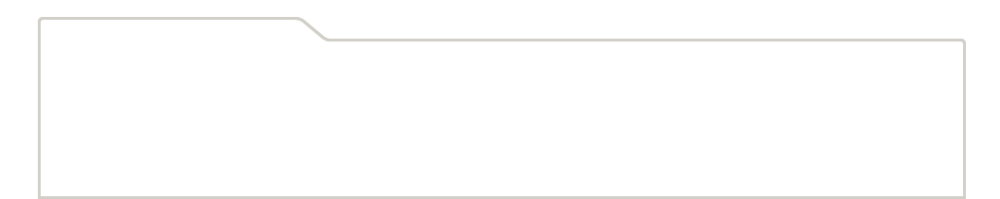
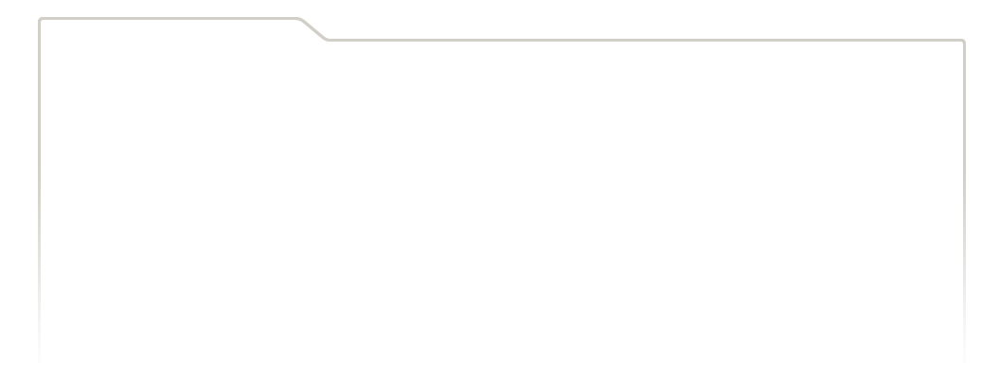
...
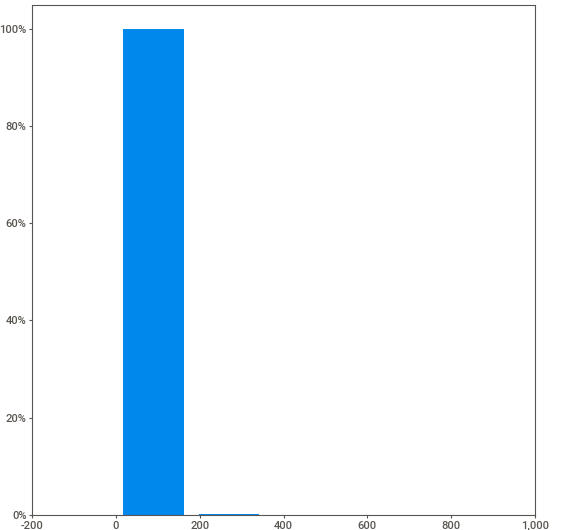
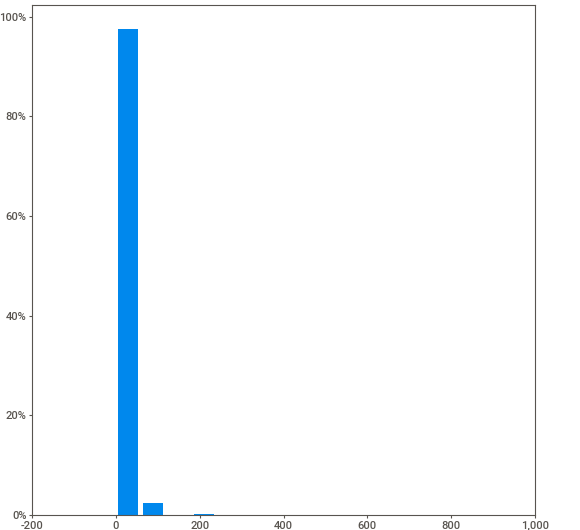
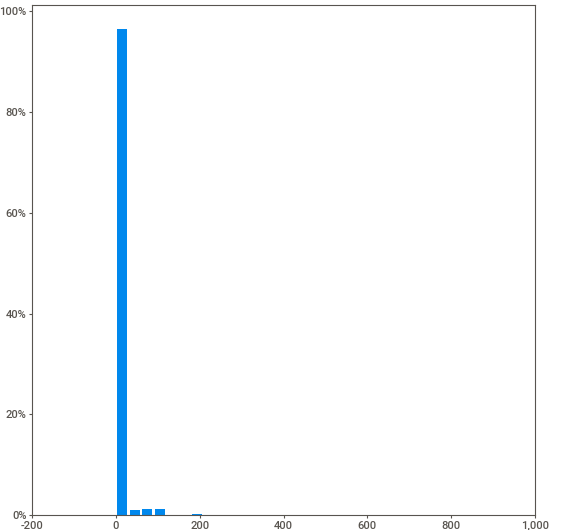
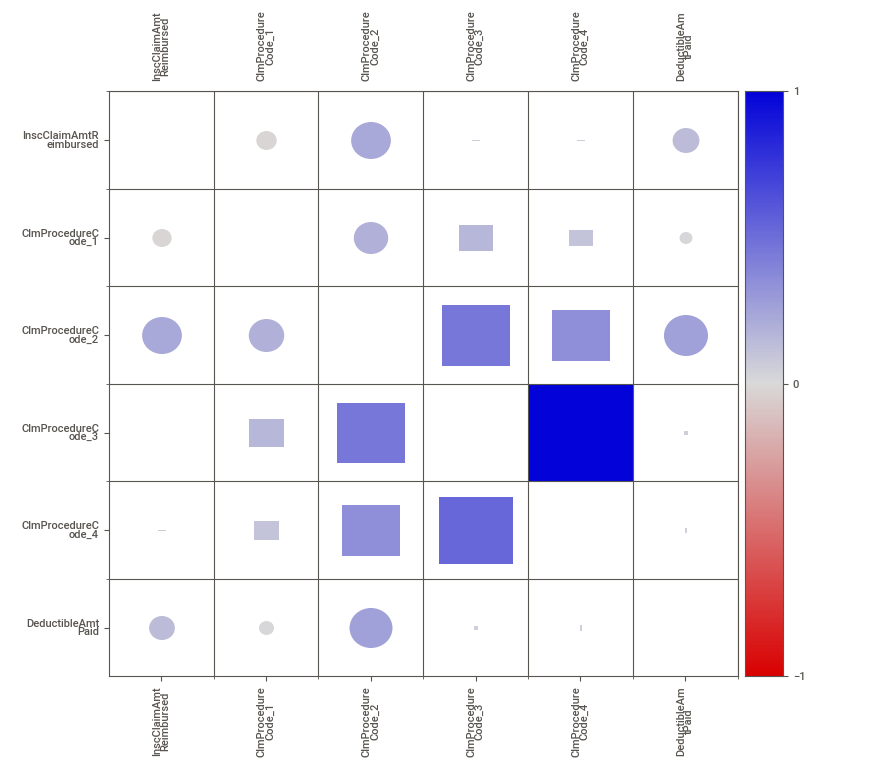
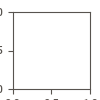

In [35]:
train_outpatient_report = sv.analyze(train_outpatient_df)
train_outpatient_report.show_notebook()

## Out-Patient Data Summary

* There are 517,737 records and similar to in-patient dataset, it contains information such as Beneficiary ID, claim ID, claim start and end date, provider information, insurance amount reimbursement, attending physician, operating physician, various diagnosis codes, various claim procedure codes, deductible amount paid, and admit diagnosis code. 

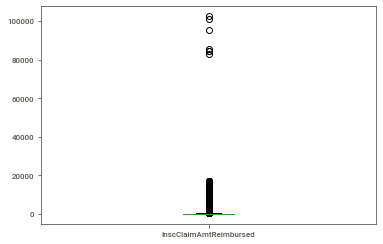

In [48]:
import matplotlib.pyplot as plt
%matplotlib notebook
%matplotlib inline
figsize = (12, 4)
train_outpatient_df.boxplot('InscClaimAmtReimbursed', grid=False)
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


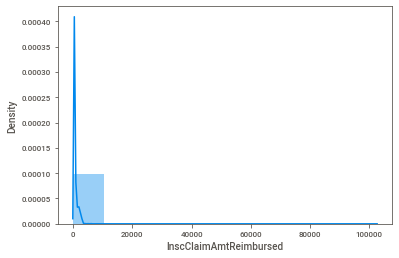

In [55]:
import seaborn as sns
sns.distplot(train_outpatient_df['InscClaimAmtReimbursed'], bins=10)
plt.show()

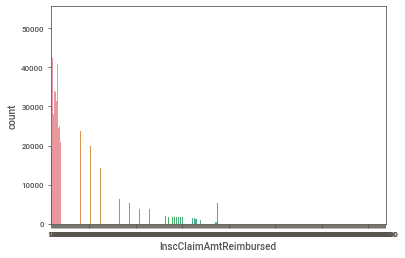

In [47]:
sns.countplot(x = 'InscClaimAmtReimbursed', data=train_outpatient_df)

# Data Engineering on Beneficiaries dataset

## Replacing values

* Replacing disease columns that have a value of 2 with 0. 0 indicates patient deos not have the corresponding disease. 

In [49]:
train_beneficiary_df.columns

Index(['BeneID', 'DOB', 'DOD', 'Gender', 'Race', 'RenalDiseaseIndicator',
       'State', 'County', 'NoOfMonths_PartACov', 'NoOfMonths_PartBCov',
       'ChronicCond_Alzheimer', 'ChronicCond_Heartfailure',
       'ChronicCond_KidneyDisease', 'ChronicCond_Cancer',
       'ChronicCond_ObstrPulmonary', 'ChronicCond_Depression',
       'ChronicCond_Diabetes', 'ChronicCond_IschemicHeart',
       'ChronicCond_Osteoporasis', 'ChronicCond_rheumatoidarthritis',
       'ChronicCond_stroke', 'IPAnnualReimbursementAmt',
       'IPAnnualDeductibleAmt', 'OPAnnualReimbursementAmt',
       'OPAnnualDeductibleAmt'],
      dtype='object')

In [50]:
train_beneficiary_df['ChronicCond_Alzheimer'].value_counts()

2    92530
1    46026
Name: ChronicCond_Alzheimer, dtype: int64

In [51]:
cols = ['ChronicCond_Alzheimer', 'ChronicCond_Heartfailure',
       'ChronicCond_KidneyDisease', 'ChronicCond_Cancer',
       'ChronicCond_ObstrPulmonary', 'ChronicCond_Depression',
       'ChronicCond_Diabetes', 'ChronicCond_IschemicHeart',
       'ChronicCond_Osteoporasis', 'ChronicCond_rheumatoidarthritis',
       'ChronicCond_stroke'] 

for col in cols:
  train_beneficiary_df.replace({col: 2}, 0, inplace=True)

In [52]:
train_beneficiary_df['ChronicCond_Alzheimer'].value_counts()


0    92530
1    46026
Name: ChronicCond_Alzheimer, dtype: int64

## Person's age

In [53]:
train_beneficiary_df['DOB'] = pd.to_datetime(train_beneficiary_df['DOB'], format = '%Y-%m-%d')
train_beneficiary_df['DOD'] = pd.to_datetime(train_beneficiary_df['DOD'], format = '%Y-%m-%d') 
train_beneficiary_df['Age'] = round((train_beneficiary_df['DOD'] - train_beneficiary_df['DOB']).dt.days/365)

In [61]:
import plotly.express as px
fig = px.histogram(train_beneficiary_df, x="Age")
fig.show()

**Take-away message**

Majority of beneficiaries are more than 65 years of age.

In [65]:
train_beneficiary_df['Age'].isna().sum(), train_beneficiary_df.shape[0]

(137135, 138556)

In [66]:
138556 - 137135

1421

There are 1421 beneficiaries that are still alive and we need to calculate their age as well. 

In [67]:
train_beneficiary_df['DOD'].max()

Timestamp('2009-12-01 00:00:00')

Beneficiary data was last recorded on 2009-12-01, so we can calculate age of people that are still alive based on this date.

In [68]:
train_beneficiary_df['Age'].fillna(round(((pd.to_datetime('2019-12-01', format='%Y-%m-%d') - train_beneficiary_df['DOB']).dt.days)/365), inplace=True)

In [69]:
train_beneficiary_df['Age'].isna().sum()

0

We no longer have any more null records for Age. 

## Add dead flag column

In [71]:
train_beneficiary_df.loc[train_beneficiary_df['DOD'].isna(), 'DeadOrNot'] = 0 
train_beneficiary_df.loc[train_beneficiary_df['DOD'].notna(), 'DeadOrNot'] = 1 

In [72]:
train_beneficiary_df['DeadOrNot'].value_counts()

0.0    137135
1.0      1421
Name: DeadOrNot, dtype: int64

# Data Engineering for in-patient dataset

## Calculating 'AdmittedDays'

Creating a new feature 'AdmittedDays' based on AdmissionDt and DischargeDt

In [73]:
train_inpatient_df.columns

Index(['BeneID', 'ClaimID', 'ClaimStartDt', 'ClaimEndDt', 'Provider',
       'InscClaimAmtReimbursed', 'AttendingPhysician', 'OperatingPhysician',
       'OtherPhysician', 'AdmissionDt', 'ClmAdmitDiagnosisCode',
       'DeductibleAmtPaid', 'DischargeDt', 'DiagnosisGroupCode',
       'ClmDiagnosisCode_1', 'ClmDiagnosisCode_2', 'ClmDiagnosisCode_3',
       'ClmDiagnosisCode_4', 'ClmDiagnosisCode_5', 'ClmDiagnosisCode_6',
       'ClmDiagnosisCode_7', 'ClmDiagnosisCode_8', 'ClmDiagnosisCode_9',
       'ClmDiagnosisCode_10', 'ClmProcedureCode_1', 'ClmProcedureCode_2',
       'ClmProcedureCode_3', 'ClmProcedureCode_4', 'ClmProcedureCode_5',
       'ClmProcedureCode_6'],
      dtype='object')

In [74]:
train_inpatient_df['AdmissionDt'] = pd.to_datetime(train_inpatient_df['AdmissionDt'], format='%Y-%m-%d')
train_inpatient_df['DischargeDt'] = pd.to_datetime(train_inpatient_df['DischargeDt'], format='%Y-%m-%d')
train_inpatient_df['AdmittedDays'] = round((train_inpatient_df['DischargeDt'] - train_inpatient_df['AdmissionDt']).dt.days + 1)

In [75]:
fig = px.histogram(train_inpatient_df, x="AdmittedDays")
fig.show()

In [77]:
train_inpatient_df['AdmittedDays'].isna().sum()

0

# Merging Inpatient and Outpatient dataset 

In [80]:
train_inpatient_df.columns, train_outpatient_df.columns

(Index(['BeneID', 'ClaimID', 'ClaimStartDt', 'ClaimEndDt', 'Provider',
        'InscClaimAmtReimbursed', 'AttendingPhysician', 'OperatingPhysician',
        'OtherPhysician', 'AdmissionDt', 'ClmAdmitDiagnosisCode',
        'DeductibleAmtPaid', 'DischargeDt', 'DiagnosisGroupCode',
        'ClmDiagnosisCode_1', 'ClmDiagnosisCode_2', 'ClmDiagnosisCode_3',
        'ClmDiagnosisCode_4', 'ClmDiagnosisCode_5', 'ClmDiagnosisCode_6',
        'ClmDiagnosisCode_7', 'ClmDiagnosisCode_8', 'ClmDiagnosisCode_9',
        'ClmDiagnosisCode_10', 'ClmProcedureCode_1', 'ClmProcedureCode_2',
        'ClmProcedureCode_3', 'ClmProcedureCode_4', 'ClmProcedureCode_5',
        'ClmProcedureCode_6', 'AdmittedDays'],
       dtype='object'),
 Index(['BeneID', 'ClaimID', 'ClaimStartDt', 'ClaimEndDt', 'Provider',
        'InscClaimAmtReimbursed', 'AttendingPhysician', 'OperatingPhysician',
        'OtherPhysician', 'ClmDiagnosisCode_1', 'ClmDiagnosisCode_2',
        'ClmDiagnosisCode_3', 'ClmDiagnosisCode_4', 'ClmDi

In [85]:
key_columns_to_merge = list(train_outpatient_df.columns)
key_columns_to_merge

['BeneID',
 'ClaimID',
 'ClaimStartDt',
 'ClaimEndDt',
 'Provider',
 'InscClaimAmtReimbursed',
 'AttendingPhysician',
 'OperatingPhysician',
 'OtherPhysician',
 'ClmDiagnosisCode_1',
 'ClmDiagnosisCode_2',
 'ClmDiagnosisCode_3',
 'ClmDiagnosisCode_4',
 'ClmDiagnosisCode_5',
 'ClmDiagnosisCode_6',
 'ClmDiagnosisCode_7',
 'ClmDiagnosisCode_8',
 'ClmDiagnosisCode_9',
 'ClmDiagnosisCode_10',
 'ClmProcedureCode_1',
 'ClmProcedureCode_2',
 'ClmProcedureCode_3',
 'ClmProcedureCode_4',
 'ClmProcedureCode_5',
 'ClmProcedureCode_6',
 'DeductibleAmtPaid',
 'ClmAdmitDiagnosisCode']

In [86]:
train_merged_patient_data = train_inpatient_df.merge(train_outpatient_df, on=key_columns_to_merge, how='outer')
train_merged_patient_data.shape

(558211, 31)

# Merging beneficiary data with all patient data

In [87]:
trainAllPatientDetailsData = train_merged_patient_data.merge(train_beneficiary_df, on='BeneID', how='inner')
trainAllPatientDetailsData.shape

(558211, 57)

In [88]:
trainAllPatientDetailsData.columns

Index(['BeneID', 'ClaimID', 'ClaimStartDt', 'ClaimEndDt', 'Provider',
       'InscClaimAmtReimbursed', 'AttendingPhysician', 'OperatingPhysician',
       'OtherPhysician', 'AdmissionDt', 'ClmAdmitDiagnosisCode',
       'DeductibleAmtPaid', 'DischargeDt', 'DiagnosisGroupCode',
       'ClmDiagnosisCode_1', 'ClmDiagnosisCode_2', 'ClmDiagnosisCode_3',
       'ClmDiagnosisCode_4', 'ClmDiagnosisCode_5', 'ClmDiagnosisCode_6',
       'ClmDiagnosisCode_7', 'ClmDiagnosisCode_8', 'ClmDiagnosisCode_9',
       'ClmDiagnosisCode_10', 'ClmProcedureCode_1', 'ClmProcedureCode_2',
       'ClmProcedureCode_3', 'ClmProcedureCode_4', 'ClmProcedureCode_5',
       'ClmProcedureCode_6', 'AdmittedDays', 'DOB', 'DOD', 'Gender', 'Race',
       'RenalDiseaseIndicator', 'State', 'County', 'NoOfMonths_PartACov',
       'NoOfMonths_PartBCov', 'ChronicCond_Alzheimer',
       'ChronicCond_Heartfailure', 'ChronicCond_KidneyDisease',
       'ChronicCond_Cancer', 'ChronicCond_ObstrPulmonary',
       'ChronicCond_Depressi

# Merging all patients data with Provider data with fraud label

In [89]:
trainAllPatientDetailsProvider = trainAllPatientDetailsData.merge(train_df, on='Provider', how='inner')
trainAllPatientDetailsProvider.shape

(558211, 58)

## Missing value information in final dataset

In [90]:
trainAllPatientDetailsProvider.isna().sum()*100/len(trainAllPatientDetailsProvider)

BeneID                               0.000000
ClaimID                              0.000000
ClaimStartDt                         0.000000
ClaimEndDt                           0.000000
Provider                             0.000000
InscClaimAmtReimbursed               0.000000
AttendingPhysician                   0.270149
OperatingPhysician                  79.497538
OtherPhysician                      64.218548
AdmissionDt                         92.749337
ClmAdmitDiagnosisCode               73.863109
DeductibleAmtPaid                    0.161050
DischargeDt                         92.749337
DiagnosisGroupCode                  92.749337
ClmDiagnosisCode_1                   1.872589
ClmDiagnosisCode_2                  35.041588
ClmDiagnosisCode_3                  56.458221
ClmDiagnosisCode_4                  70.524407
ClmDiagnosisCode_5                  79.949517
ClmDiagnosisCode_6                  84.881702
ClmDiagnosisCode_7                  88.144805
ClmDiagnosisCode_8                

# EDA Continued

In [92]:
fig = px.histogram(trainAllPatientDetailsProvider, x="PotentialFraud",
                   title='Distribution of Potential Fraud Column',)
fig.show()

In [108]:
df_plot = trainAllPatientDetailsProvider.groupby(['ClmProcedureCode_1','PotentialFraud']).size().reset_index(name="counts")\
                                        .sort_values(by=['counts'], ascending=False)
df_plot = df_plot[:13]
df_plot

,ClmProcedureCode_1,PotentialFraud,counts
1710,9904.0,Yes,634
1278,8154.0,Yes,615
30,66.0,Yes,538
1709,9904.0,No,518
523,3893.0,Yes,483
579,3995.0,Yes,477
1277,8154.0,No,407
522,3893.0,No,371
671,4516.0,Yes,370
29,66.0,No,362


In [109]:
px.bar(data_frame=df_plot, x="ClmProcedureCode_1", y="counts", color="PotentialFraud", barmode="group")